In [116]:
import dotenv
import os

dotenv.load_dotenv()
import matplotlib.pyplot as plt
%matplotlib inline

from typing import List, Tuple

import random
import numpy

In [117]:
from utils.frameReader import FrameReader
from utils.predictor import GVLPredictor
from utils.visualiser import GVLVisualizer
from utils.vlm import ClaudeVLM, OpenAIVLM, GeminiVLM

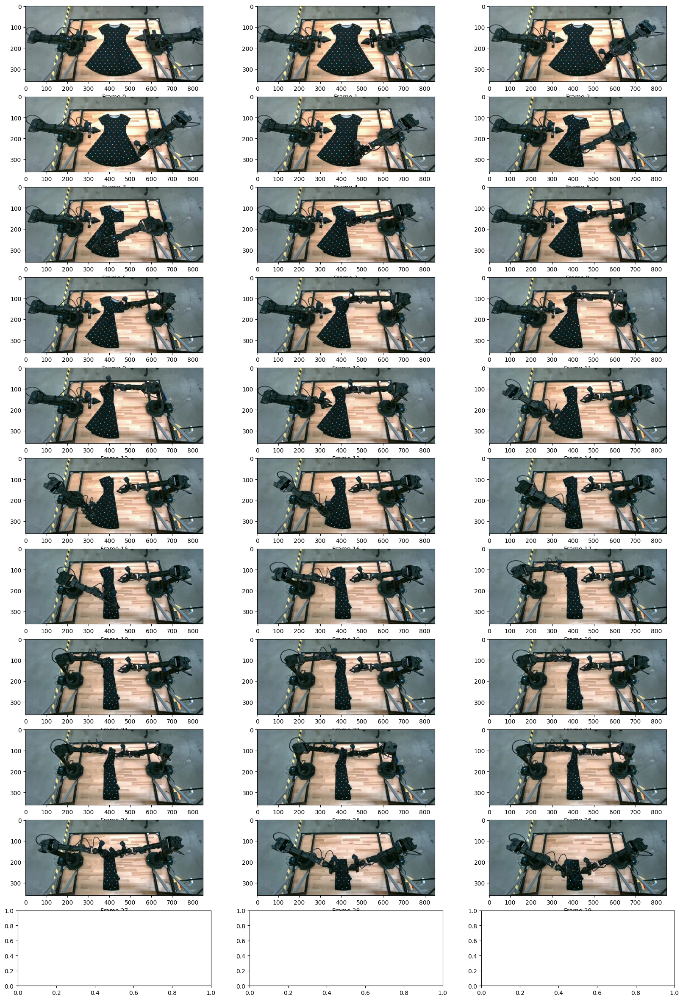

In [118]:
image_columns = 3

# Read frames
frames_dir = "data/frames/fold_dress"
frames = FrameReader.read_frames_from_dir(frames_dir)

num_frames = len(frames)
fig, ax = plt.subplots(num_frames//image_columns + 1, image_columns, figsize=(20, 30))
c = 0
for i, ix in enumerate(frames):
    ax[c//image_columns][c%image_columns].imshow(ix)
    #set x label
    ax[c//image_columns][c%image_columns].set_xlabel(f"Frame {i}")

    c+=1

In [119]:
def shuffle_frames(
    frames: List, keep_first: bool = True
) -> Tuple[List, List]:
    """Shuffle frames while optionally keeping first frame fixed."""
    if keep_first:
        first_frame = frames[0]
        remaining_frames = frames[1:]
        shuffled_indices = list(range(1, len(frames)))
        random.shuffle(shuffled_indices)

        shuffled_frames = [first_frame] + [frames[i] for i in shuffled_indices]
        indices = [0] + shuffled_indices
    else:
        shuffled_indices = list(range(len(frames)))
        random.shuffle(shuffled_indices)
        shuffled_frames = [frames[i] for i in shuffled_indices]
        indices = shuffled_indices

    return shuffled_frames, indices

In [120]:
shuffled_frames, indices = shuffle_frames(frames)

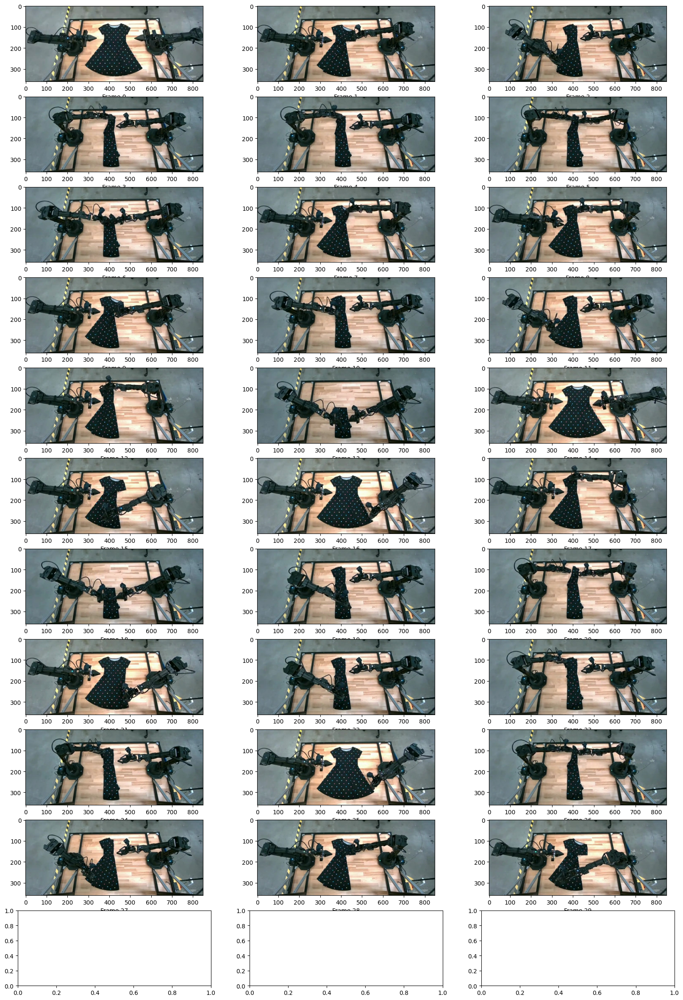

In [121]:
fig, ax = plt.subplots(num_frames//image_columns + 1, image_columns, figsize=(20, 30))
c = 0
for i, ix in enumerate(shuffled_frames):
    ax[c//image_columns][c%image_columns].imshow(ix)
    #set x label
    ax[c//image_columns][c%image_columns].set_xlabel(f"Frame {i}")

    c+=1

In [122]:
import io

In [123]:
import base64

import google.generativeai as genai
from IPython.display import Markdown
from PIL import Image

# Assuming you have the following:
# - list_pil_images: list of PIL images
# - list_base64_images: list of base64 encoded strings of the images
# - task_description: string describing the task

# Prepare the prompt with the task description
prompt_template = """
You are an expert roboticist tasked to predict task completion percentages for frames of a robot for the task of {task_description}. You are given {num_frames} frames.
The task completion percentages are between 0 and 100, where 100 corresponds to full task completion. We provide several examples of the robot performing the task at various stages and their corresponding task completion percentages. Note that these frames are in random order, so please pay attention to the individual frames when reasoning about task completion percentage.
Initial robot scene: [IMG]
In the initial robot scene, the task completion percentage is 0.
Now, for the task of {task_description}, output the task completion percentage for the following frames that are presented in random order. For each frame, format your response as follow: Frame [i]: Frame Description: [], Task Completion Percentages:[]%
Frame 1: [IMG]
...
Frame n: [IMG]
"""


In [124]:
task_description = "folding a dress"

In [125]:
def image_to_base64(image: Image.Image, format="JPEG") -> str:
    buffer = io.BytesIO()
    image.save(buffer, format=format)
    img_str = base64.b64encode(buffer.getvalue()).decode("utf-8")
    return img_str


In [126]:
list_base64_images = [image_to_base64(Image.fromarray(numpy.array(ix))) for ix in shuffled_frames]

In [127]:
key = os.getenv("GEMINI_API_KEY")
genai.configure(api_key=key)
model = genai.GenerativeModel(model_name="gemini-2.0-flash-exp")


In [128]:
prompt = prompt_template.format(task_description=task_description, num_frames=len(frames))

In [129]:
print(prompt)


You are an expert roboticist tasked to predict task completion percentages for frames of a robot for the task of folding a dress. You are given 30 frames.
The task completion percentages are between 0 and 100, where 100 corresponds to full task completion. We provide several examples of the robot performing the task at various stages and their corresponding task completion percentages. Note that these frames are in random order, so please pay attention to the individual frames when reasoning about task completion percentage.
Initial robot scene: [IMG]
In the initial robot scene, the task completion percentage is 0.
Now, for the task of folding a dress, output the task completion percentage for the following frames that are presented in random order. For each frame, format your response as follow: Frame [i]: Frame Description: [], Task Completion Percentages:[]%
Frame 1: [IMG]
...
Frame n: [IMG]



In [130]:
import typing_extensions as typing

class TaskProgress(typing.TypedDict):
    frame_n: int
    discription: str
    completion_percentage: int

In [131]:
# Prepare the list of images for the LLM
images_for_llm = []
for base64_image in list_base64_images:
    image_dict = {
        'mime_type': 'image/jpeg',  # Adjust MIME type if necessary
        'data': base64_image
    }
    images_for_llm.append(image_dict)

# Insert the initial scene image at the beginning
initial_image_base64 = list_base64_images[0]  # Assuming the first image is the initial scene
images_for_llm.insert(0, {
    'mime_type': 'image/jpeg',
    'data': initial_image_base64
})

generation_config={"response_mime_type": "application/json",
                   "response_schema": list[TaskProgress]}

# Generate content using the model
response = model.generate_content([prompt] + images_for_llm)

# Print the response
print(response.text)

Okay, I understand. I will analyze each frame and provide an estimated task completion percentage for the dress folding task. Here's my analysis:

Frame 1: Frame Description: [The dress lies flat on the table, untouched by the robot arms], Task Completion Percentages:[0]%
Frame 2: Frame Description: [Both robot arms are grasping opposite sides of the dress at the shoulders], Task Completion Percentages:[5]%
Frame 3: Frame Description: [One robot arm is lifting the dress, while the other is holding it], Task Completion Percentages:[10]%
Frame 4: Frame Description: [The robot arms are bringing the two sides of the dress together, it appears that the sleeves are being folded], Task Completion Percentages:[25]%
Frame 5: Frame Description: [The dress is held by two robot arms, it is now mostly folded in half], Task Completion Percentages:[35]%
Frame 6: Frame Description: [The dress is held by two robot arms, it appears that the sleeves are now nicely folded inwards], Task Completion Percent

In [134]:
import json

lines = response.text.strip().split('\n')

frames = []

for line in lines:
    if line.startswith('Frame '):
        # Extract frame number
        frame_no = int(line.split(':')[0].split(' ')[1])
        # Extract description
        description_start = line.find('Frame Description: [') + len('Frame Description: [')
        description_end = line.find('], Task Completion Percentages:')
        description = line[description_start:description_end]
        # Extract percentage
        percentage_start = line.find('Task Completion Percentages:[') + len('Task Completion Percentages:[')
        percentage_end = line.find(']%', percentage_start)
        percentage = int(line[percentage_start:percentage_end])
        # Create dictionary and append to list
        frame = {
            "frame_no": frame_no,
            "description": description,
            "percentage": percentage
        }
        frames.append(frame)

# Convert to JSON
json_output = json.dumps(frames, indent=4)
print(json_output)

[
    {
        "frame_no": 1,
        "description": "The dress lies flat on the table, untouched by the robot arms",
        "percentage": 0
    },
    {
        "frame_no": 2,
        "description": "Both robot arms are grasping opposite sides of the dress at the shoulders",
        "percentage": 5
    },
    {
        "frame_no": 3,
        "description": "One robot arm is lifting the dress, while the other is holding it",
        "percentage": 10
    },
    {
        "frame_no": 4,
        "description": "The robot arms are bringing the two sides of the dress together, it appears that the sleeves are being folded",
        "percentage": 25
    },
    {
        "frame_no": 5,
        "description": "The dress is held by two robot arms, it is now mostly folded in half",
        "percentage": 35
    },
    {
        "frame_no": 6,
        "description": "The dress is held by two robot arms, it appears that the sleeves are now nicely folded inwards",
        "percentage": 45
    },
  

In [135]:
frames[0]

{'frame_no': 1,
 'description': 'The dress lies flat on the table, untouched by the robot arms',
 'percentage': 0}

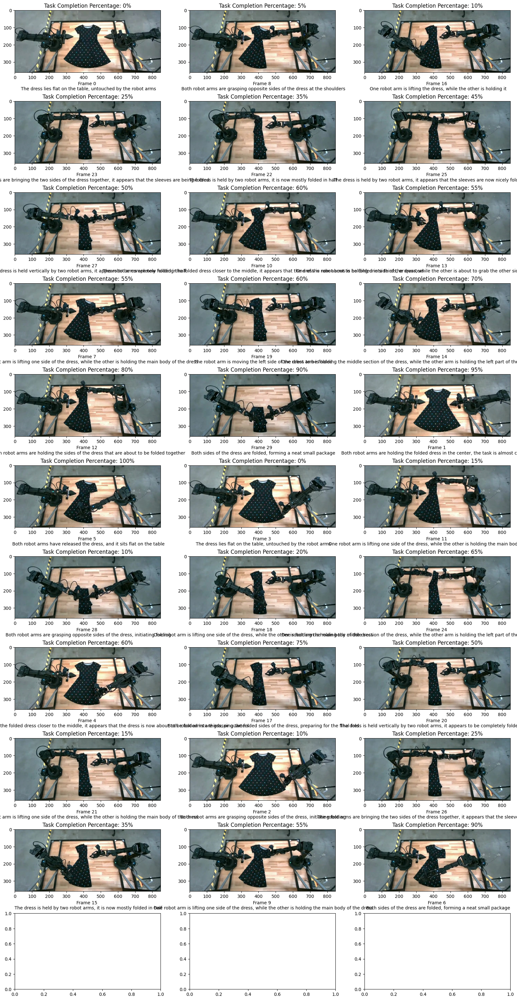

In [136]:
fig, ax = plt.subplots(num_frames//image_columns + 1, image_columns, figsize=(20, 40))
c = 0
for i, (image, indice, json_obj) in enumerate(zip(shuffled_frames, indices, frames)):
    ax[c//image_columns][c%image_columns].imshow(image)
    #set x label
    ax[c//image_columns][c%image_columns].set_xlabel(f"Frame {indice} \n {json_obj['description']}")
    
    ax[c//image_columns][c%image_columns].title.set_text(f"Task Completion Percentage: {json_obj['percentage']}%")
    c+=1